In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns

In [2]:
df = pd.read_excel("D:\\python\\python_data-insights\\data_insight-Battle\\transactions.xlsx")

In [3]:
df.head()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion
0,1000667075,2022-09-12 17:40:23,David King,5,30.98,Debit Card,Chicago,Warehouse Club,True,Teenager,Fall,BOGO (Buy One Get One)
1,1000156022,2022-01-20 23:03:20,Michael Williamson,3,23.29,Credit Card,Boston,Warehouse Club,True,Homemaker,Winter,Discount on Selected Items
2,1000681674,2022-10-15 07:49:59,Chelsea Garza,7,25.62,Debit Card,Chicago,Pharmacy,False,Teenager,Fall,Discount on Selected Items
3,1000692089,2024-04-05 09:39:58,Scott Lopez,5,14.64,Mobile Payment,Atlanta,Pharmacy,False,Homemaker,Summer,Discount on Selected Items
4,1000328702,2021-05-28 04:16:54,Crystal Adams,4,62.27,Credit Card,Miami,Convenience Store,False,Retiree,Summer,NaN


In [4]:
df.sort_values(by='Date', ascending = True, inplace = True)
df.head()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,NaN
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,NaN
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One)
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One)
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items


In [5]:
empty_rows = df[df.isnull().all(axis=1)]
empty_rows

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion


In [6]:
df['Promotion'] = df['Promotion'].fillna('No Promotion')

In [7]:
df.head(10)

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One)
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One)
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items
7050,1000172370,2020-01-01 09:43:52,Jay Jones,6,52.63,Cash,San Francisco,Supermarket,True,Homemaker,Fall,Discount on Selected Items
16939,1000650358,2020-01-01 10:01:05,Colleen Delgado,8,53.54,Credit Card,Houston,Department Store,True,Retiree,Fall,No Promotion
14382,1000544729,2020-01-01 13:23:32,Evelyn Castro,8,80.13,Debit Card,Dallas,Supermarket,True,Homemaker,Fall,Discount on Selected Items
24054,1000340531,2020-01-01 18:43:17,Jessica Watkins,4,60.62,Credit Card,Atlanta,Department Store,True,Middle-Aged,Summer,Discount on Selected Items
7964,1000652224,2020-01-01 19:35:06,Luis Hall,5,82.87,Debit Card,Atlanta,Specialty Store,False,Retiree,Spring,Discount on Selected Items


 ##        ''' 1. What is the average transaction amount ($) across different store types, and how does it vary by season? '''

The average amount across diffrent store types:

In [10]:
average_amount = df.groupby('Store_Type')['Amount($)'].mean()
average_amount

Store_Type
Convenience Store    52.845181
Department Store     52.332447
Pharmacy             52.526439
Specialty Store      52.688152
Supermarket          52.254317
Warehouse Club       52.109283
Name: Amount($), dtype: float64

In [11]:
df['Average_amount'] = df['Store_Type'].map(df.groupby('Store_Type')['Amount($)'].mean())
df.head()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181


'''The average amount across diffrent store types and it's variation by Seasons: '''

In [13]:
average_amount = df.groupby(['Store_Type', 'Season'])['Amount($)'].mean()
average_amount

Store_Type         Season
Convenience Store  Fall      52.872504
                   Spring    53.537230
                   Summer    53.345305
                   Winter    51.595034
Department Store   Fall      51.384757
                   Spring    52.573781
                   Summer    52.782716
                   Winter    52.575652
Pharmacy           Fall      52.363508
                   Spring    52.458672
                   Summer    52.049365
                   Winter    53.218725
Specialty Store    Fall      51.823011
                   Spring    53.524048
                   Summer    53.594788
                   Winter    51.782338
Supermarket        Fall      52.285728
                   Spring    52.691298
                   Summer    51.443950
                   Winter    52.640624
Warehouse Club     Fall      52.027853
                   Spring    51.597471
                   Summer    53.009120
                   Winter    51.818594
Name: Amount($), dtype: float64

In [14]:
variation_df = df
variation_df = variation_df.copy()
variation_df['Average_amount_by_Season'] = df.set_index(['Store_Type', 'Season']).index.map(average_amount)
variation_df.head()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount,Average_amount_by_Season
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317,52.691298
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439,52.363508
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317,52.691298
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439,52.458672
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181,51.595034


In [3]:
## ''' 1. average amount across different store types and how it vary by season '''

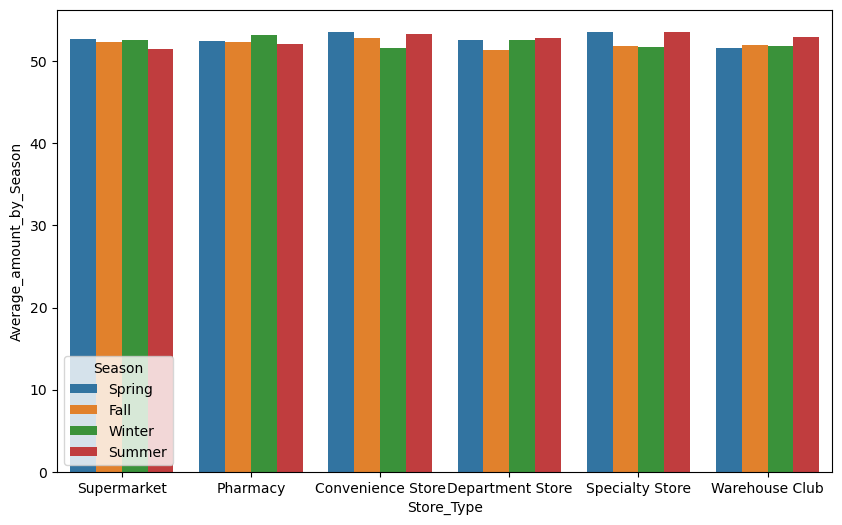

In [16]:
plt.figure(figsize = (10, 6), dpi = 100)
sns.barplot(x = 'Store_Type', y = 'Average_amount_by_Season', hue='Season',data = variation_df)
plt.savefig('barplot_Q1.png')

Here we ca see (barplot_Q1.png) the variation of average amount($) of different store types by season

##  ''' 2. Which payment method is most commonly used in high-value transactions (above the average transaction amount), and how does it differ across cities? '''

In [19]:
# Compute the overall average amount
average_amount1 = df['Amount($)'].mean()
average_amount1

52.459843116883114

In [20]:
# Compute the average amount per Payment_Method
average_per_payment = df.groupby('Payment_Method')['Amount($)'].mean()
average_per_payment

Payment_Method
Cash              52.876011
Credit Card       52.199792
Debit Card        52.894245
Mobile Payment    51.870452
Name: Amount($), dtype: float64

'''Debit card is most commonly used in high value transactions '''

In [22]:
# Determine if each Payment_Method's average is greater than the overall average
High_value_payment_method = average_per_payment > average_amount1
High_value_payment_method

Payment_Method
Cash               True
Credit Card       False
Debit Card         True
Mobile Payment    False
Name: Amount($), dtype: bool

In [23]:
payment_method_table = df[['Payment_Method', 'Amount($)', 'City']]
payment_method_table = payment_method_table.copy()
payment_method_table.head(10)

,Payment_Method,Amount($),City
20745,Mobile Payment,31.23,Chicago
8885,Debit Card,17.75,Chicago
36946,Credit Card,5.04,Seattle
8012,Credit Card,33.68,Boston
19307,Mobile Payment,39.88,Boston
7050,Cash,52.63,San Francisco
16939,Credit Card,53.54,Houston
14382,Debit Card,80.13,Dallas
24054,Credit Card,60.62,Atlanta
7964,Debit Card,82.87,Atlanta


In [24]:
payment_method_debit_card = payment_method_table[payment_method_table['Payment_Method'] == 'Debit Card']
payment_method_debit_card.head()

,Payment_Method,Amount($),City
8885,Debit Card,17.75,Chicago
14382,Debit Card,80.13,Dallas
7964,Debit Card,82.87,Atlanta
27517,Debit Card,61.51,Dallas
7453,Debit Card,69.69,Chicago


In [25]:
# debit_card_high_value = 52.894245
payment_method_debit_card_high_value = payment_method_debit_card[payment_method_debit_card['Amount($)'] >= 52.894245]
payment_method_debit_card_high_value.head()

,Payment_Method,Amount($),City
14382,Debit Card,80.13,Dallas
7964,Debit Card,82.87,Atlanta
27517,Debit Card,61.51,Dallas
7453,Debit Card,69.69,Chicago
25915,Debit Card,99.37,Chicago


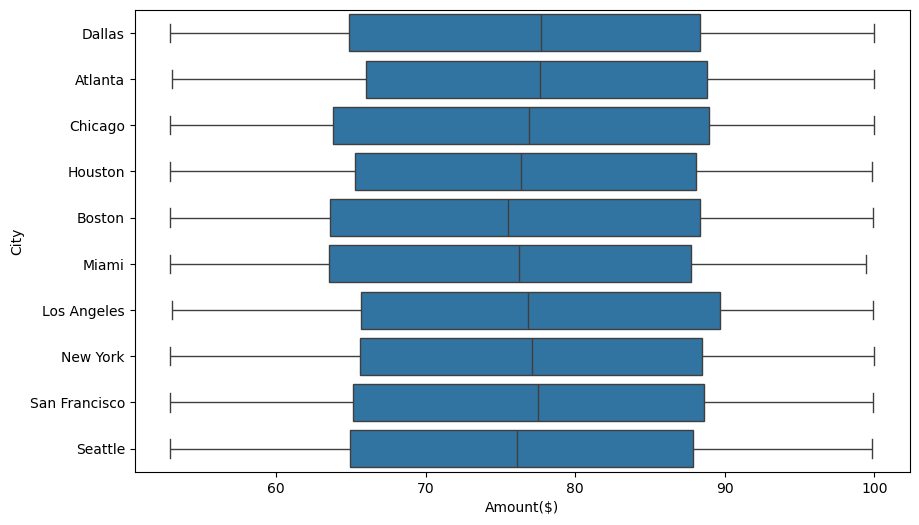

In [26]:
plt.figure(figsize = (10, 6), dpi = 100)
sns.boxplot(x = 'Amount($)', y = 'City', data = payment_method_debit_card_high_value)
plt.savefig('boxplot_Q2.png')

''' Here we ca see (boxplot_Q2.png) the variation of high value transaction using debit card across cities '''

In [28]:
df.head()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181


In [29]:
df.tail()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount
6068,1000068716,2024-05-18 17:54:28,Richard Cannon,7,33.80,Cash,Dallas,Supermarket,True,Professional,Fall,BOGO (Buy One Get One),52.254317
16672,1000012308,2024-05-18 18:32:15,John Williams,2,76.65,Debit Card,Miami,Specialty Store,True,Middle-Aged,Spring,No Promotion,52.688152
10441,1000262898,2024-05-18 18:40:17,Marie Evans,7,89.97,Cash,Dallas,Department Store,False,Homemaker,Winter,Discount on Selected Items,52.332447
34787,1000424076,2024-05-18 18:53:32,Lisa Johnson,10,31.08,Credit Card,San Francisco,Pharmacy,True,Student,Summer,BOGO (Buy One Get One),52.526439
6907,1000247237,2024-05-18 19:06:29,Gary Stanley,2,34.97,Cash,Seattle,Department Store,True,Professional,Spring,Discount on Selected Items,52.332447


##  ''' 3. How do the sales amounts in transactions with discounts compare to those without discounts, and what trends can be observed over the month? '''

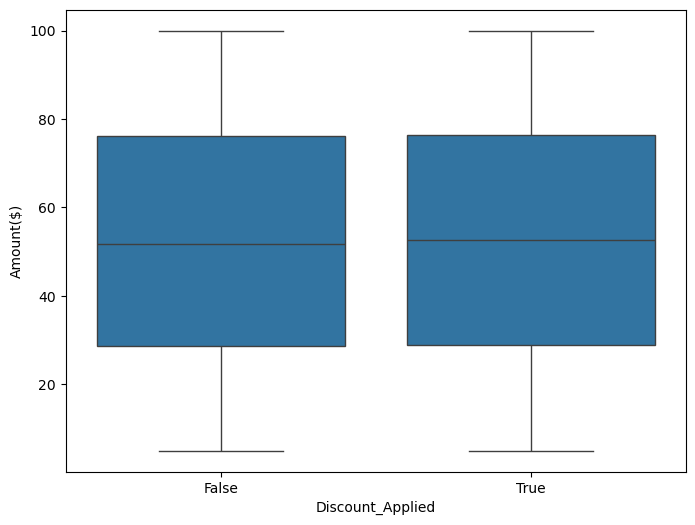

In [31]:
## 3. sales amounts in transactions with discount comparison to transactions without discount
plt.figure(figsize = (8, 6), dpi = 100)
sns.boxplot(x = 'Discount_Applied', y = 'Amount($)', data = df)
plt.savefig('boxplot_Q3.png')

 ''' Here we can see (boxplot_Q3.png) Sales amounts with Discount is almost similar to Sales amounts without Discount '''

In [33]:
df1 = df
df1 = df1.copy()
df1['Date'] = pd.to_datetime(df1['Date'])
df1.head()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181


In [34]:
# 3. add month name column in terms of Date column
df1['Month_Name'] = df1['Date'].dt.month_name()
df1.head()

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount,Month_Name
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317,January
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439,January
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317,January
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439,January
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181,January


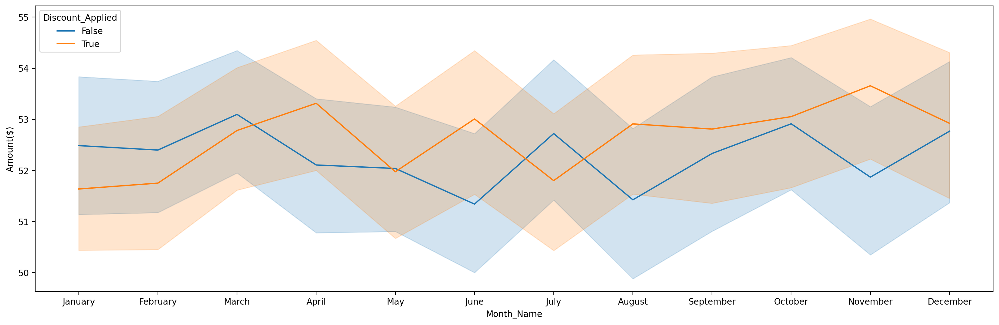

In [35]:
## 3.trends over the month for sales amounts in transactions with discount comparison to transactions without discount
plt.figure(figsize = (20, 6), dpi = 200)
sns.lineplot(x = 'Month_Name', y = 'Amount($)', hue ='Discount_Applied', data = df1)
plt.savefig('lineplot_Q3.png')

''' Here we can see (lineplot_Q3.png) The trends over the month for sales amounts in transactions with discount comparison to transactions without discount across every months '''

In [37]:
december_data = df1[(df1['Date'].dt.year == 2022) & (df1['Date'].dt.month == 12)]
december_data

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount,Month_Name
18156,1000860419,2022-12-01 00:37:14,Rhonda Smith,4,18.36,Credit Card,Los Angeles,Convenience Store,False,Young Adult,Fall,No Promotion,52.845181,December
9390,1000466207,2022-12-01 00:37:32,Joseph Decker,6,9.03,Mobile Payment,Los Angeles,Warehouse Club,True,Professional,Spring,No Promotion,52.109283,December
2674,1000376749,2022-12-01 00:48:54,Stacy Page,9,34.01,Cash,Los Angeles,Pharmacy,True,Student,Winter,No Promotion,52.526439,December
28474,1000403789,2022-12-01 00:50:38,Denise Roth,8,90.33,Credit Card,Los Angeles,Warehouse Club,False,Teenager,Summer,No Promotion,52.109283,December
17134,1000636520,2022-12-01 01:25:48,Christine King,3,66.44,Debit Card,Houston,Supermarket,True,Senior Citizen,Winter,Discount on Selected Items,52.254317,December
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21301,1000877940,2022-12-31 20:02:41,Morgan Gould,2,18.53,Debit Card,Los Angeles,Department Store,False,Teenager,Spring,Discount on Selected Items,52.332447,December
1859,1000861845,2022-12-31 20:16:16,Ricky Lane,4,77.85,Cash,New York,Convenience Store,True,Senior Citizen,Spring,No Promotion,52.845181,December
29131,1000461647,2022-12-31 22:04:15,Alexander Stein,4,18.89,Mobile Payment,Houston,Warehouse Club,True,Young Adult,Fall,BOGO (Buy One Get One),52.109283,December
35314,1000900022,2022-12-31 23:27:29,Matthew Newman MD,8,7.63,Credit Card,Seattle,Warehouse Club,True,Middle-Aged,Spring,Discount on Selected Items,52.109283,December


In [38]:
## trends over the month for sales amounts in transactions with discount comparison to transactions without discount
plt.figure(figsize = (50, 20), dpi = 400)
sns.lineplot(x = 'Date', y = 'Amount($)', hue ='Discount_Applied', data = december_data)
plt.savefig('lineplot_Q3_2.png')
#sns.lineplot(x = 'Discount_Applied', y = 'Amount($)', hue ='Date', data = december_data)
# plt.savefig('barplot1.png')

'''Here we can see (lineplot_Q3_2.png) The trends over the month for sales amounts in transactions with discount comparison to transactions without discount over a single month '''

In [40]:
df.head(10)

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181
7050,1000172370,2020-01-01 09:43:52,Jay Jones,6,52.63,Cash,San Francisco,Supermarket,True,Homemaker,Fall,Discount on Selected Items,52.254317
16939,1000650358,2020-01-01 10:01:05,Colleen Delgado,8,53.54,Credit Card,Houston,Department Store,True,Retiree,Fall,No Promotion,52.332447
14382,1000544729,2020-01-01 13:23:32,Evelyn Castro,8,80.13,Debit Card,Dallas,Supermarket,True,Homemaker,Fall,Discount on Selected Items,52.254317
24054,1000340531,2020-01-01 18:43:17,Jessica Watkins,4,60.62,Credit Card,Atlanta,Department Store,True,Middle-Aged,Summer,Discount on Selected Items,52.332447
7964,1000652224,2020-01-01 19:35:06,Luis Hall,5,82.87,Debit Card,Atlanta,Specialty Store,False,Retiree,Spring,Discount on Selected Items,52.688152


## ''' 4. What are the top three cities with the highest average number of items per transaction, and how do their sales amounts vary across seasons? '''

In [42]:
# Sclicing through columns
df2 = df[['Total_Items', 'Amount($)', 'City', 'Season']]
df2 = df2.copy()
df2.head()

,Total_Items,Amount($),City,Season
20745,9,31.23,Chicago,Spring
8885,2,17.75,Chicago,Fall
36946,2,5.04,Seattle,Spring
8012,1,33.68,Boston,Spring
19307,9,39.88,Boston,Winter


In [43]:
# add column of average_number_items
df2['average_number_items'] = df2['City'].map(df2.groupby('City')['Total_Items'].mean())
df2.head(10)

,Total_Items,Amount($),City,Season,average_number_items
20745,9,31.23,Chicago,Spring,5.547601
8885,2,17.75,Chicago,Fall,5.547601
36946,2,5.04,Seattle,Spring,5.457897
8012,1,33.68,Boston,Spring,5.483299
19307,9,39.88,Boston,Winter,5.483299
7050,6,52.63,San Francisco,Fall,5.456952
16939,8,53.54,Houston,Fall,5.530272
14382,8,80.13,Dallas,Fall,5.489892
24054,4,60.62,Atlanta,Summer,5.461580
7964,5,82.87,Atlanta,Spring,5.461580


In [44]:
## average_number_items from highest to lowest
sorted_df = df2.sort_values(by='average_number_items', ascending = False)
sorted_df

,Total_Items,Amount($),City,Season,average_number_items
20745,9,31.23,Chicago,Spring,5.547601
10945,6,62.03,Chicago,Spring,5.547601
28697,2,9.34,Chicago,Winter,5.547601
16903,3,50.56,Chicago,Spring,5.547601
26355,2,27.59,Chicago,Spring,5.547601
...,...,...,...,...,...
1114,10,71.91,San Francisco,Summer,5.456952
23859,7,39.52,San Francisco,Summer,5.456952
3582,4,70.67,San Francisco,Fall,5.456952
28528,6,56.18,San Francisco,Fall,5.456952


In [45]:
#sorted_df2 = df2.count('City').head(3)
top_3_numberofitems = sorted_df['City'].head(3).index
top_3_numberofitems

Index([20745, 10945, 28697], dtype='int64')

In [46]:
# Extract unique values in order
top_3_values = round(sorted_df['average_number_items'],6).unique()[:3]
top_3_values

array([5.547601, 5.530272, 5.521909])

In [47]:
top_3_values = sorted_df['average_number_items'].unique()[:3]
top_3_values

array([5.54760052, 5.53027193, 5.52190923])

In [48]:
## 4.Top 3 cities with the highest average number of items
filtered_df = sorted_df.loc[sorted_df['average_number_items'] > 5.52190923]
filtered_df

,Total_Items,Amount($),City,Season,average_number_items
20745,9,31.23,Chicago,Spring,5.547601
10945,6,62.03,Chicago,Spring,5.547601
28697,2,9.34,Chicago,Winter,5.547601
16903,3,50.56,Chicago,Spring,5.547601
26355,2,27.59,Chicago,Spring,5.547601
...,...,...,...,...,...
26624,9,87.77,Miami,Winter,5.521909
26057,6,86.32,Miami,Fall,5.521909
24585,10,8.48,Miami,Summer,5.521909
16456,2,36.89,Miami,Fall,5.521909


In [49]:
top_3_cities = filtered_df['City'].unique()
top_3_cities

array(['Chicago', 'Houston', 'Miami'], dtype=object)

'''The Top 3 Cities with the highest average number of items per transaction are: Chicago, Houston, Miami '''

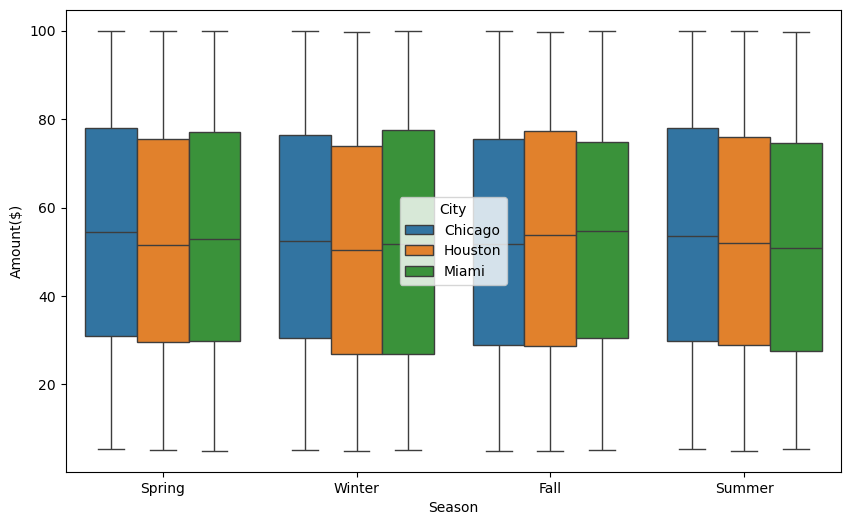

In [51]:
## 4. comparison of sales amounts in terms of City vary across season
plt.figure(figsize = (10, 6), dpi = 100)
sns.boxplot(x = 'Season', y = 'Amount($)', hue ='City', data = filtered_df)
plt.savefig('boxplot_Q4.png')

'''Here we see (boxplot_Q4.png) the variation of sales amounts for this 3 cities across seasons '''

In [53]:
df.head(10)

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181
7050,1000172370,2020-01-01 09:43:52,Jay Jones,6,52.63,Cash,San Francisco,Supermarket,True,Homemaker,Fall,Discount on Selected Items,52.254317
16939,1000650358,2020-01-01 10:01:05,Colleen Delgado,8,53.54,Credit Card,Houston,Department Store,True,Retiree,Fall,No Promotion,52.332447
14382,1000544729,2020-01-01 13:23:32,Evelyn Castro,8,80.13,Debit Card,Dallas,Supermarket,True,Homemaker,Fall,Discount on Selected Items,52.254317
24054,1000340531,2020-01-01 18:43:17,Jessica Watkins,4,60.62,Credit Card,Atlanta,Department Store,True,Middle-Aged,Summer,Discount on Selected Items,52.332447
7964,1000652224,2020-01-01 19:35:06,Luis Hall,5,82.87,Debit Card,Atlanta,Specialty Store,False,Retiree,Spring,Discount on Selected Items,52.688152


## '''5. How effective are different promotions in driving higher transaction amounts, and which promotion type performs best in each season? '''

In [55]:
has_duplicates = df['Transaction_ID'].duplicated().any()
has_duplicates

False

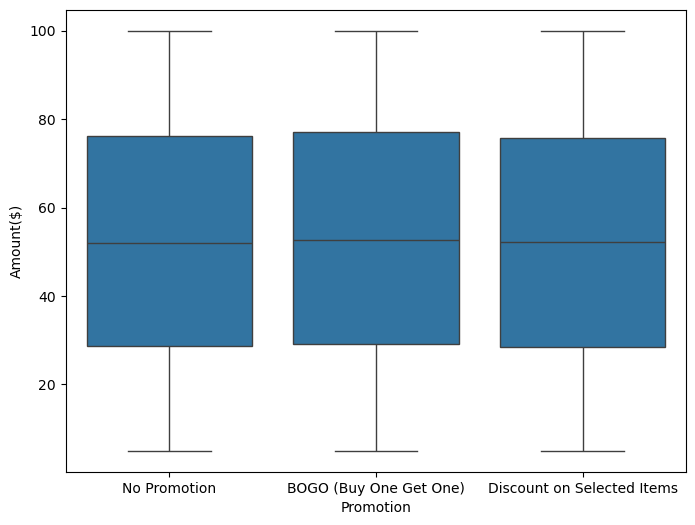

In [56]:
## 5. effectiveness of different promotions in terms of sales amount
plt.figure(figsize = (8, 6), dpi = 100)
sns.boxplot(x = 'Promotion', y = 'Amount($)', data = df)
plt.savefig('boxplot_Q5.png')

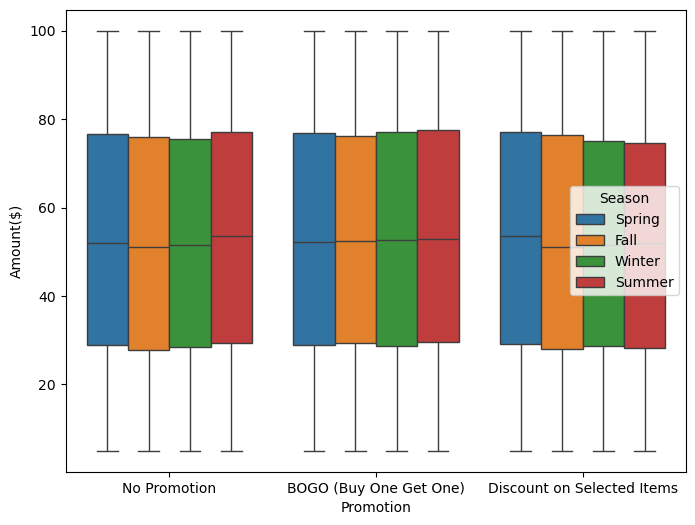

In [57]:
plt.figure(figsize = (8, 6), dpi = 100)
sns.boxplot(x = 'Promotion', y = 'Amount($)', hue = 'Season', data = df)
plt.savefig('boxplot_Q5_2.png')

In [58]:
df.head(10)

,Transaction_ID,Date,Customer_Name,Total_Items,Amount($),Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion,Average_amount
20745,1000499251,2020-01-01 03:51:50,David Davis,9,31.23,Mobile Payment,Chicago,Supermarket,False,Professional,Spring,No Promotion,52.254317
8885,1000156828,2020-01-01 05:25:10,April Carroll,2,17.75,Debit Card,Chicago,Pharmacy,True,Middle-Aged,Fall,No Promotion,52.526439
36946,1000609464,2020-01-01 05:47:18,Stephanie Hendricks,2,5.04,Credit Card,Seattle,Supermarket,False,Homemaker,Spring,BOGO (Buy One Get One),52.254317
8012,1000040714,2020-01-01 06:53:56,Robin Horn,1,33.68,Credit Card,Boston,Pharmacy,False,Middle-Aged,Spring,BOGO (Buy One Get One),52.526439
19307,1000192943,2020-01-01 09:06:09,Pamela Wilson,9,39.88,Mobile Payment,Boston,Convenience Store,False,Professional,Winter,Discount on Selected Items,52.845181
7050,1000172370,2020-01-01 09:43:52,Jay Jones,6,52.63,Cash,San Francisco,Supermarket,True,Homemaker,Fall,Discount on Selected Items,52.254317
16939,1000650358,2020-01-01 10:01:05,Colleen Delgado,8,53.54,Credit Card,Houston,Department Store,True,Retiree,Fall,No Promotion,52.332447
14382,1000544729,2020-01-01 13:23:32,Evelyn Castro,8,80.13,Debit Card,Dallas,Supermarket,True,Homemaker,Fall,Discount on Selected Items,52.254317
24054,1000340531,2020-01-01 18:43:17,Jessica Watkins,4,60.62,Credit Card,Atlanta,Department Store,True,Middle-Aged,Summer,Discount on Selected Items,52.332447
7964,1000652224,2020-01-01 19:35:06,Luis Hall,5,82.87,Debit Card,Atlanta,Specialty Store,False,Retiree,Spring,Discount on Selected Items,52.688152


In [59]:
d5 = df[['Amount($)','Promotion','Season']]
d5.head(10)

,Amount($),Promotion,Season
20745,31.23,No Promotion,Spring
8885,17.75,No Promotion,Fall
36946,5.04,BOGO (Buy One Get One),Spring
8012,33.68,BOGO (Buy One Get One),Spring
19307,39.88,Discount on Selected Items,Winter
7050,52.63,Discount on Selected Items,Fall
16939,53.54,No Promotion,Fall
14382,80.13,Discount on Selected Items,Fall
24054,60.62,Discount on Selected Items,Summer
7964,82.87,Discount on Selected Items,Spring


In [60]:
sorted_amount = d5.sort_values(by='Amount($)', ascending = False)
sorted_amount

,Amount($),Promotion,Season
2645,100.00,Discount on Selected Items,Summer
29771,100.00,BOGO (Buy One Get One),Summer
12181,100.00,No Promotion,Fall
35217,99.99,BOGO (Buy One Get One),Fall
17189,99.99,BOGO (Buy One Get One),Winter
...,...,...,...
8084,5.01,BOGO (Buy One Get One),Fall
31325,5.01,Discount on Selected Items,Fall
5298,5.00,No Promotion,Winter
23200,5.00,Discount on Selected Items,Summer


In [61]:
## slicing 1st 100 rows with highest transactipon amounts from sorted_amount rable 
sorted_amount1 = sorted_amount[:100]
sorted_amount1

,Amount($),Promotion,Season
2645,100.00,Discount on Selected Items,Summer
29771,100.00,BOGO (Buy One Get One),Summer
12181,100.00,No Promotion,Fall
35217,99.99,BOGO (Buy One Get One),Fall
17189,99.99,BOGO (Buy One Get One),Winter
...,...,...,...
7335,99.75,Discount on Selected Items,Fall
35883,99.75,Discount on Selected Items,Spring
23765,99.75,No Promotion,Spring
27098,99.75,No Promotion,Spring


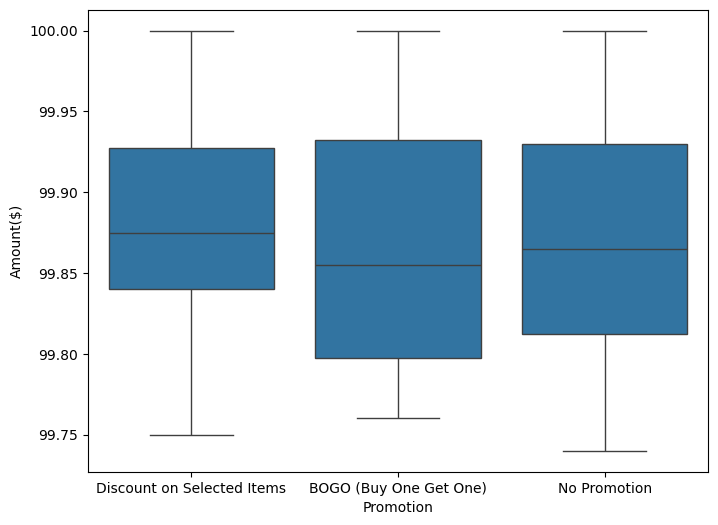

In [62]:
## The effectiveness of different promotions in driving higher transaction amounts
plt.figure(figsize = (8, 6), dpi = 100)
sns.boxplot(x = 'Promotion', y = 'Amount($)', data = sorted_amount1)
plt.savefig('boxplot_Q5_3.png')

'''Here we can see (boxplot_Q5_3.png) BOGO (Buy One Get One) is most effective in driving higher transaction amounts '''

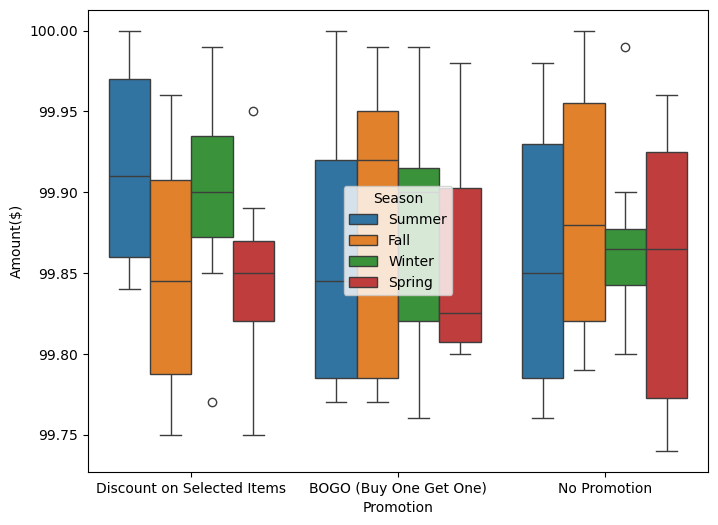

In [64]:
## The performance of different promotions in driving higher transaction amounts across season
plt.figure(figsize = (8, 6), dpi = 100)
sns.boxplot(x = 'Promotion', y = 'Amount($)', hue = 'Season', data = sorted_amount1)
plt.savefig('boxplot_Q5_4.png')

''' Here we can see(boxplot_Q5_4.png) in terms of driving higher transaction amounts BOGO (Buy One Get One) is always performs good in every seasons '''